<a href="https://colab.research.google.com/github/Vanisha-18/AIML_Projects-Labs/blob/main/dragonfruit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q kagglehub
import kagglehub, os

path = kagglehub.dataset_download("nguynphancminh/dragonfruitdataset-qma")
print("Downloaded to:", path)

for root, dirs, files in os.walk(path):
    level = root.replace(path, "").count(os.sep)
    indent = "  " * level
    print(f"{indent}{os.path.basename(root)}/")
    if level <= 2:
        for f in files[:5]:
            print(f"{indent}  {f}")
        if len(files) > 5:
            print(f"{indent}  ... ({len(files)} files total)")

100%|██████████| 929M/929M [00:08<00:00, 113MB/s]

Extracting files...


Downloaded to: /root/.cache/kagglehub/datasets/nguynphancminh/dragonfruitdataset-qma/versions/1
1/
  oversample/
    Leaf/
      Stem Rot/
      Stem_Canker/
      Anthracnose/
      White Spot/
      Twig Blight/
      Brown Spot/
      Healthy/
      Root Rot/
      Black Spot/
      Soft Rot/
    Fruit/
      Anthracnose/
      White Spot/
      Fruit Rot/
      Brown Spot/
      Healthy/
      Soft Rot/


In [2]:
pip install -q imagehash

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 10.2 MB/s eta 0:00:00


In [3]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import tensorflow as tf
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix

sns.set_style("whitegrid")
np.random.seed(42)
tf.random.set_seed(42)

TASK = "Leaf"   # we'll do Leaf first, Fruit later as a separate run
BASE_DIR = os.path.join(path, "oversample") # Corrected path by removing "1"
DATA_DIR = os.path.join(BASE_DIR, TASK)
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
MIN_IMAGES_PER_CLASS = 30

print("Task:", TASK)
print("Classes found:", os.listdir(DATA_DIR))


Task: Leaf
Classes found: ['Stem Rot', 'Stem_Canker', 'Anthracnose', 'White Spot', 'Twig Blight', 'Brown Spot', 'Healthy', 'Root Rot', 'Black Spot', 'Soft Rot']


In [4]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
from PIL import Image # Make sure PIL is imported for Image.open

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
    layers.RandomBrightness(0.1),
])

def make_dataset(df, training=False):
    def _load_image_py_func(filepath):
        # Decode filepath tensor to string
        img_path = filepath.numpy().decode('utf-8')
        try:
            img = Image.open(img_path).convert("RGB")
            img = img.resize(IMG_SIZE) # Resize using PIL
            img_array = np.array(img).astype(np.float32)
            return img_array
        except Exception as e:
            tf.print(f"Error loading image {img_path}: {e}")
            # Return a black image as a placeholder for corrupted files
            return np.zeros(IMG_SIZE + (3,), dtype=np.float32)

    def load_image_label(filepath, label):
        # Wrap the Python function for image loading and processing
        img = tf.py_function(_load_image_py_func, [filepath], tf.float32)
        img.set_shape(IMG_SIZE + (3,)) # Ensure the shape is explicitly set
        return img, label

    ds = tf.data.Dataset.from_tensor_slices((df["filepath"], df["label_idx"]))
    ds = ds.map(load_image_label, num_parallel_calls=tf.data.AUTOTUNE)
    if training:
        ds = ds.shuffle(1000).batch(BATCH_SIZE).map(lambda x, y: (data_augmentation(x, training=True), y), num_parallel_calls=tf.data.AUTOTUNE).prefetch(tf.data.AUTOTUNE)
    else:
        ds = ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return ds

In [5]:
import imagehash
from PIL import Image
from sklearn.model_selection import train_test_split

def create_split_dataframes(df_original, MIN_IMAGES_PER_CLASS, IMG_SIZE, HAMMING_THRESHOLD=6, random_state=42):
    # Ensure imagehash is available (assumed from previous pip install)

    df = df_original.copy()

    # ---- 1. Perceptual hash every image ----
    def compute_phash(path, hash_size=8):
        try:
            return imagehash.phash(Image.open(path).convert("RGB"), hash_size=hash_size)
        except Exception:
            return None

    df["phash"] = df["filepath"].apply(compute_phash)
    df = df.dropna(subset=["phash"]).reset_index(drop=True)
    n = len(df)
    print(f"Total images after phash and dropping unreadable: {n}")

    # ---- 2. Cluster near-duplicates (union-find on Hamming distance) ----
    parent = list(range(n))
    def find(x):
        while parent[x] != x:
            parent[x] = parent[parent[x]]
            x = parent[x]
        return x
    def union(x, y):
        rx, ry = find(x), find(y)
        if rx != ry:
            parent[rx] = ry

    hashes = df["phash"].tolist()
    for i in range(n):
        for j in range(i + 1, n):
            if hashes[i] - hashes[j] <= HAMMING_THRESHOLD:
                union(i, j)

    df["cluster"] = [find(i) for i in range(n)]

    # Get unique cluster IDs for splitting
    unique_clusters = df["cluster"].unique()
    # For stratification, use the label of the first image in each cluster
    # This assumes consistent labels within a cluster (near-duplicates should have the same label)
    cluster_labels = df.groupby("cluster")["label_idx"].first()

    # Split clusters into train, validation, and test sets
    train_clusters, temp_clusters, _, _ = train_test_split(
        unique_clusters, cluster_labels.loc[unique_clusters], test_size=0.3, stratify=cluster_labels.loc[unique_clusters], random_state=random_state
    )
    val_clusters, test_clusters, _, _ = train_test_split(
        temp_clusters, cluster_labels.loc[temp_clusters], test_size=0.5, stratify=cluster_labels.loc[temp_clusters], random_state=random_state
    )

    # Filter original df to create train_df, val_df, test_df based on cluster IDs
    train_df = df[df["cluster"].isin(train_clusters)].reset_index(drop=True)
    val_df = df[df["cluster"].isin(val_clusters)].reset_index(drop=True)
    test_df = df[df["cluster"].isin(test_clusters)].reset_index(drop=True)

    print(f"\nTrain: {len(train_df)}  Val: {len(val_df)}  Test: {len(test_df)}")

    # Verify no cross-split leakage (should be none with this method)
    # Assign split info back to original df for verification if needed
    df["split"] = "none"
    df.loc[df["cluster"].isin(train_clusters), "split"] = "train"
    df.loc[df["cluster"].isin(val_clusters), "split"] = "val"
    df.loc[df["cluster"].isin(test_clusters), "split"] = "test"

    leaked_groups = [g for _, g in df.groupby("cluster") if g["split"].nunique() > 1]

    if leaked_groups:
        print("⚠️ LEAKAGE DETECTED (should not happen with cluster-aware splitting)")
    else:
        print("✅ No cross-split near-duplicates found with this cluster-aware splitting method.")

    return train_df, val_df, test_df

In [6]:
import os
import glob, hashlib
import pandas as pd

TASK = "Leaf"
DATA_DIR = os.path.join(BASE_DIR, TASK)

print("Task:", TASK)
print("Classes found:", os.listdir(DATA_DIR))

class_counts_check = {c: len(os.listdir(os.path.join(DATA_DIR, c))) for c in os.listdir(DATA_DIR)}
DROP_CLASSES = [c for c, n in class_counts_check.items() if n < MIN_IMAGES_PER_CLASS]
if DROP_CLASSES:
    print(f"Dropping classes with <{MIN_IMAGES_PER_CLASS} images: {DROP_CLASSES}")

def file_hash(p):
    with open(p, "rb") as f:
        return hashlib.md5(f.read()).hexdigest()

seen_hashes, unique_files, dup_count = {}, [], 0
for class_name in os.listdir(DATA_DIR):
    if class_name in DROP_CLASSES:
        continue
    class_path = os.path.join(DATA_DIR, class_name)
    for img_path in glob.glob(os.path.join(class_path, "*")):
        try:
            h = file_hash(img_path)
        except Exception:
            continue
        if h in seen_hashes:
            dup_count += 1
            continue
        seen_hashes[h] = img_path
        unique_files.append((img_path, class_name))

df = pd.DataFrame(unique_files, columns=["filepath", "label"])
class_names = sorted(df["label"].unique())
label_to_idx = {c: i for i, c in enumerate(class_names)}
df["label_idx"] = df["label"].map(label_to_idx)

print(f"Duplicates removed: {dup_count}")
print(f"\nFinal classes used ({TASK}):")
print(df["label"].value_counts())

# Using the new helper function to split data with duplicate removal
train_df, val_df, test_df = create_split_dataframes(df, MIN_IMAGES_PER_CLASS, IMG_SIZE)

# Create TensorFlow datasets
train_ds = make_dataset(train_df, training=True)
val_ds = make_dataset(val_df)
test_ds = make_dataset(test_df)

Task: Leaf
Classes found: ['Stem Rot', 'Stem_Canker', 'Anthracnose', 'White Spot', 'Twig Blight', 'Brown Spot', 'Healthy', 'Root Rot', 'Black Spot', 'Soft Rot']
Duplicates removed: 700

Final classes used (Leaf):
label
Stem Rot       292
Root Rot       276
Healthy        250
Brown Spot     198
Soft Rot       192
Black Spot     152
White Spot     122
Anthracnose     74
Twig Blight     63
Stem_Canker     58
Name: count, dtype: int64
Total images after phash and dropping unreadable: 1677

Train: 1169  Val: 264  Test: 244
✅ No cross-split near-duplicates found with this cluster-aware splitting method.


### Data Splitting for Leaf Task (with duplicate removal and cluster-aware splitting)

/tmp/ipykernel_619/3593281211.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette="Greens_d")


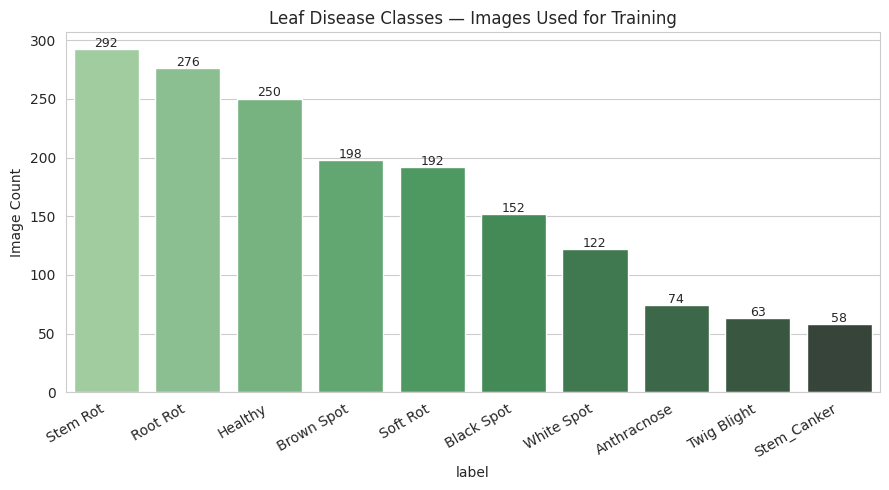

In [7]:
plt.figure(figsize=(9,5))
counts = df["label"].value_counts()
sns.barplot(x=counts.index, y=counts.values, palette="Greens_d")
plt.title(f"{TASK} Disease Classes — Images Used for Training")
plt.ylabel("Image Count")
plt.xticks(rotation=30, ha="right")
for i, v in enumerate(counts.values):
    plt.text(i, v+2, str(v), ha="center", fontsize=9)
plt.tight_layout()
plt.show()

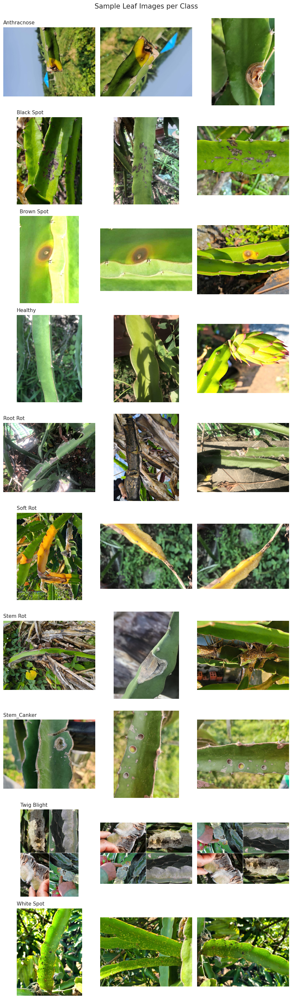

In [8]:
fig, axes = plt.subplots(len(class_names), 3, figsize=(9, 3*len(class_names)))
for i, c in enumerate(class_names):
    samples = df[df["label"]==c]["filepath"].values[:3]
    for j, p in enumerate(samples):
        img = Image.open(p)
        ax = axes[i, j] if len(class_names) > 1 else axes[j]
        ax.imshow(img)
        ax.axis("off")
    axes[i, 0].set_title(c, loc="left", fontsize=11)
plt.tight_layout()
plt.suptitle(f"Sample {TASK} Images per Class", y=1.01, fontsize=15)
plt.show()

In [9]:
class_weights_arr = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(train_df["label_idx"]),
    y=train_df["label_idx"]
)
class_weight_dict = dict(enumerate(class_weights_arr))

for idx, w in class_weight_dict.items():
    print(f"{class_names[idx]:15s}: weight {w:.2f}")

Anthracnose    : weight 2.29
Black Spot     : weight 1.05
Brown Spot     : weight 0.97
Healthy        : weight 0.62
Root Rot       : weight 0.60
Soft Rot       : weight 0.81
Stem Rot       : weight 0.57
Stem_Canker    : weight 3.00
Twig Blight    : weight 3.44
White Spot     : weight 1.43


In [10]:
base_model = tf.keras.applications.MobileNetV2(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights="imagenet"
)
base_model.trainable = False

inputs = tf.keras.Input(shape=IMG_SIZE + (3,))
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(128, activation="relu")(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(len(class_names), activation="softmax")(x)

model = tf.keras.Model(inputs, outputs, name=f"mobilenetv2_{TASK.lower()}")
model.compile(optimizer=tf.keras.optimizers.Adam(1e-3),
              loss="sparse_categorical_crossentropy", metrics=["accuracy"])
model.summary()

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "mobilenetv2_leaf"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,423,242 (9.24 MB)

 Trainable params: 165,258 (645.54 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [11]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=6, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=3)
]

history = model.fit(
    train_ds, validation_data=val_ds, epochs=20,
    class_weight=class_weight_dict, callbacks=callbacks
)

Epoch 1/20
37/37 ━━━━━━━━━━━━━━━━━━━━ 145s 1s/step - accuracy: 0.4636 - loss: 1.5409 - val_accuracy: 0.7348 - val_loss: 0.7791 - learning_rate: 0.0010
Epoch 2/20
37/37 ━━━━━━━━━━━━━━━━━━━━ 103s 901ms/step - accuracy: 0.7357 - loss: 0.7300 - val_accuracy: 0.8371 - val_loss: 0.4940 - learning_rate: 0.0010
Epoch 3/20
37/37 ━━━━━━━━━━━━━━━━━━━━ 95s 794ms/step - accuracy: 0.8118 - loss: 0.4797 - val_accuracy: 0.8674 - val_loss: 0.4286 - learning_rate: 0.0010
Epoch 4/20
37/37 ━━━━━━━━━━━━━━━━━━━━ 96s 913ms/step - accuracy: 0.8512 - loss: 0.3879 - val_accuracy: 0.8674 - val_loss: 0.4084 - learning_rate: 0.0010
Epoch 5/20
37/37 ━━━━━━━━━━━━━━━━━━━━ 97s 904ms/step - accuracy: 0.8956 - loss: 0.3055 - val_accuracy: 0.9091 - val_loss: 0.3475 - learning_rate: 0.0010
Epoch 6/20
37/37 ━━━━━━━━━━━━━━━━━━━━ 102s 914ms/step - accuracy: 0.8939 - loss: 0.2721 - val_accuracy: 0.9015 - val_loss: 0.3002 - learning_rate: 0.0010
Epoch 7/20
37/37 ━━━━━━━━━━━━━━━━━━━━ 102s 916ms/step - accuracy: 0.8999 - loss: 0

In [12]:
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(1e-5),
              loss="sparse_categorical_crossentropy", metrics=["accuracy"])

history_fine = model.fit(
    train_ds, validation_data=val_ds, epochs=10,
    class_weight=class_weight_dict, callbacks=callbacks
)

Epoch 1/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 132s 1s/step - accuracy: 0.7032 - loss: 0.8054 - val_accuracy: 0.9394 - val_loss: 0.1980 - learning_rate: 1.0000e-05
Epoch 2/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 100s 784ms/step - accuracy: 0.7784 - loss: 0.5331 - val_accuracy: 0.9205 - val_loss: 0.2250 - learning_rate: 1.0000e-05
Epoch 3/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 95s 805ms/step - accuracy: 0.8332 - loss: 0.4156 - val_accuracy: 0.9205 - val_loss: 0.2383 - learning_rate: 1.0000e-05
Epoch 4/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 97s 834ms/step - accuracy: 0.8571 - loss: 0.3495 - val_accuracy: 0.9242 - val_loss: 0.2433 - learning_rate: 5.0000e-06
Epoch 5/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 93s 798ms/step - accuracy: 0.8648 - loss: 0.3244 - val_accuracy: 0.9205 - val_loss: 0.2470 - learning_rate: 5.0000e-06
Epoch 6/10
37/37 ━━━━━━━━━━━━━━━━━━━━ 148s 916ms/step - accuracy: 0.8820 - loss: 0.3189 - val_accuracy: 0.9205 - val_loss: 0.2454 - learning_rate: 5.0000e-06


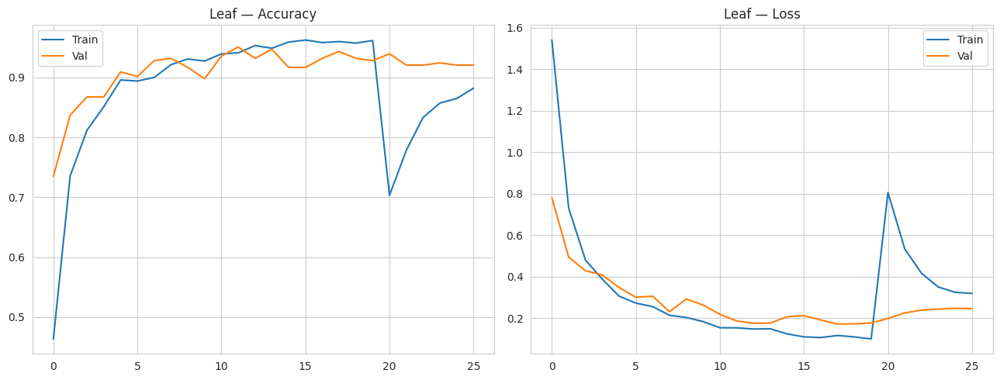

8/8 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step - accuracy: 0.9631 - loss: 0.1753

Leaf — Test Accuracy: 96.31%


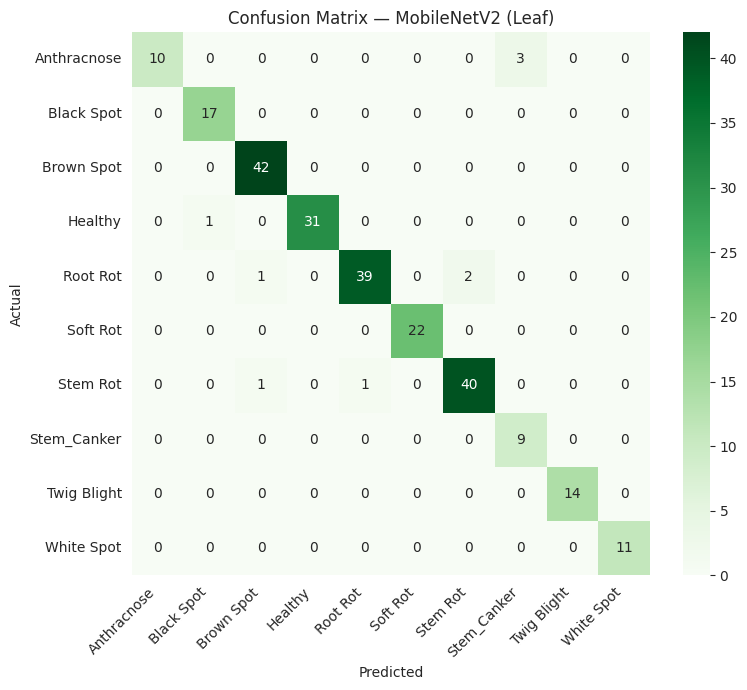

              precision    recall  f1-score   support

 Anthracnose       1.00      0.77      0.87        13
  Black Spot       0.94      1.00      0.97        17
  Brown Spot       0.95      1.00      0.98        42
     Healthy       1.00      0.97      0.98        32
    Root Rot       0.97      0.93      0.95        42
    Soft Rot       1.00      1.00      1.00        22
    Stem Rot       0.95      0.95      0.95        42
 Stem_Canker       0.75      1.00      0.86         9
 Twig Blight       1.00      1.00      1.00        14
  White Spot       1.00      1.00      1.00        11

    accuracy                           0.96       244
   macro avg       0.96      0.96      0.96       244
weighted avg       0.97      0.96      0.96       244



In [13]:
acc = history.history["accuracy"] + history_fine.history["accuracy"]
val_acc = history.history["val_accuracy"] + history_fine.history["val_accuracy"]
loss = history.history["loss"] + history_fine.history["loss"]
val_loss = history.history["val_loss"] + history_fine.history["val_loss"]

fig, axes = plt.subplots(1, 2, figsize=(13,5))
axes[0].plot(acc, label="Train"); axes[0].plot(val_acc, label="Val")
axes[0].set_title(f"{TASK} — Accuracy"); axes[0].legend()
axes[1].plot(loss, label="Train"); axes[1].plot(val_loss, label="Val")
axes[1].set_title(f"{TASK} — Loss"); axes[1].legend()
plt.tight_layout(); plt.show()

y_true, y_pred = [], []
for images, labels in test_ds:
    preds = model.predict(images, verbose=0)
    y_pred.extend(np.argmax(preds, axis=1))
    y_true.extend(labels.numpy())

test_loss, test_acc = model.evaluate(test_ds)
print(f"\n{TASK} — Test Accuracy: {test_acc*100:.2f}%")

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8,7))
sns.heatmap(cm, annot=True, fmt="d", cmap="Greens", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted"); plt.ylabel("Actual")
plt.title(f"Confusion Matrix — MobileNetV2 ({TASK})")
plt.xticks(rotation=45, ha="right")
plt.tight_layout(); plt.show()

print(classification_report(y_true, y_pred, target_names=class_names))

In [14]:
TASK = "Fruit"
DATA_DIR = os.path.join(BASE_DIR, TASK)

print("Task:", TASK)
print("Classes found:", os.listdir(DATA_DIR))

Task: Fruit
Classes found: ['Anthracnose', 'White Spot', 'Fruit Rot', 'Brown Spot', 'Healthy', 'Soft Rot']


### Data Splitting for Fruit Task (with duplicate removal and cluster-aware splitting)

/tmp/ipykernel_619/2207238378.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.index, y=counts.values, palette="Oranges_d")


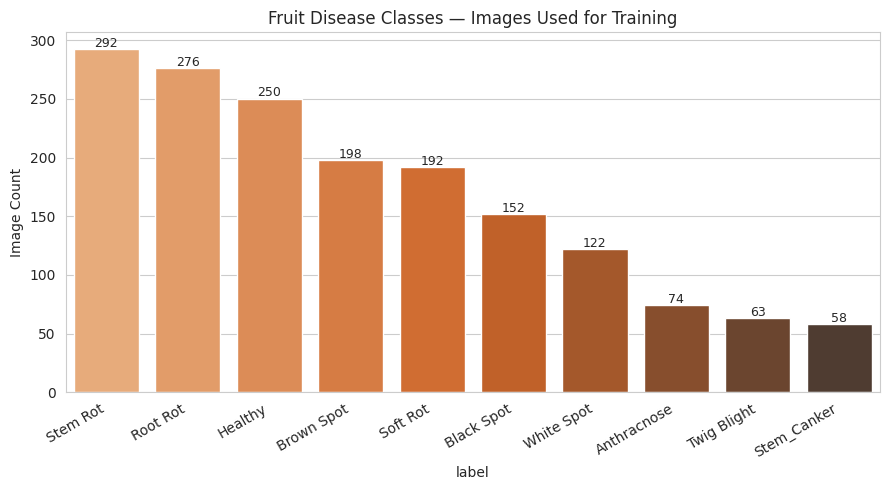

In [15]:
plt.figure(figsize=(9,5))
counts = df["label"].value_counts()
sns.barplot(x=counts.index, y=counts.values, palette="Oranges_d")
plt.title(f"{TASK} Disease Classes — Images Used for Training")
plt.ylabel("Image Count")
plt.xticks(rotation=30, ha="right")
for i, v in enumerate(counts.values):
    plt.text(i, v+2, str(v), ha="center", fontsize=9)
plt.tight_layout()
plt.show()

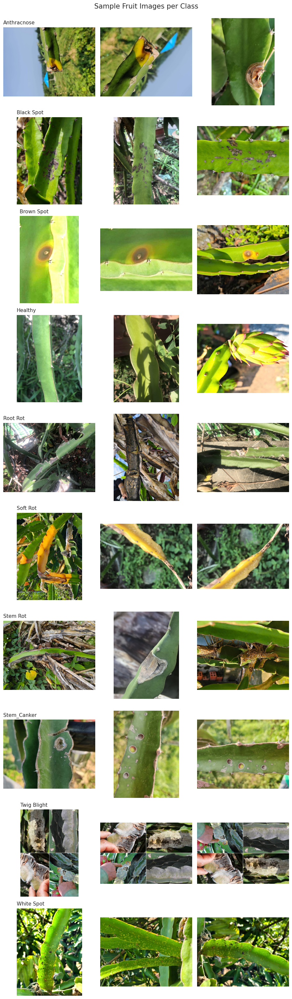

In [16]:
fig, axes = plt.subplots(len(class_names), 3, figsize=(9, 3*len(class_names)))
for i, c in enumerate(class_names):
    samples = df[df["label"]==c]["filepath"].values[:3]
    for j, p in enumerate(samples):
        img = Image.open(p)
        ax = axes[i, j] if len(class_names) > 1 else axes[j]
        ax.imshow(img)
        ax.axis("off")
    axes[i, 0].set_title(c, loc="left", fontsize=11)
plt.tight_layout()
plt.suptitle(f"Sample {TASK} Images per Class", y=1.01, fontsize=15)
plt.show()

In [29]:
import os
import glob, hashlib
import pandas as pd
import imagehash # Added for perceptual hashing
from PIL import Image # Added for image manipulation (rotation)
from sklearn.model_selection import train_test_split # Added for data splitting

TASK = "Fruit"
BASE_DIR = os.path.join(path, "oversample") # Redeclaring BASE_DIR for the Fruit task
DATA_DIR = os.path.join(BASE_DIR, TASK)

print("Task:", TASK)
print("Classes found:", os.listdir(DATA_DIR))

class_counts_check = {c: len(os.listdir(os.path.join(DATA_DIR, c))) for c in os.listdir(DATA_DIR)}
DROP_CLASSES = [c for c, n in class_counts_check.items() if n < MIN_IMAGES_PER_CLASS]
if DROP_CLASSES:
    print(f"Dropping classes with <{MIN_IMAGES_PER_CLASS} images: {DROP_CLASSES}")

def file_hash(p):
    with open(p, "rb") as f:
        return hashlib.md5(f.read()).hexdigest()

seen_hashes, unique_files, dup_count = {}, [], 0
for class_name in os.listdir(DATA_DIR):
    if class_name in DROP_CLASSES:
        continue
    class_path = os.path.join(DATA_DIR, class_name)
    for img_path in glob.glob(os.path.join(class_path, "*")):
        try:
            h = file_hash(img_path)
        except Exception:
            continue
        if h in seen_hashes:
            dup_count += 1
            continue
        seen_hashes[h] = img_path
        unique_files.append((img_path, class_name))

df = pd.DataFrame(unique_files, columns=["filepath", "label"])
class_names = sorted(df["label"].unique())
label_to_idx = {c: i for i, c in enumerate(class_names)}
df["label_idx"] = df["label"].map(label_to_idx)

print(f"Duplicates removed (exact matches): {dup_count}")
print(f"\nFinal classes used ({TASK}):")
print(df["label"].value_counts())

# --- Start of Modified Rotation-Invariant Duplicate Detection and Splitting Logic ---

# Define parameters for perceptual hashing and splitting
HAMMING_THRESHOLD = 6
RANDOM_STATE = 42

def compute_phash_rotation_invariant(path, hash_size=8):
    """Computes phashes for an image and its 90/180/270 degree rotations."""
    try:
        img = Image.open(path).convert("RGB")
        hashes = [
            imagehash.phash(img, hash_size=hash_size), # Original
            imagehash.phash(img.rotate(90, expand=True), hash_size=hash_size),
            imagehash.phash(img.rotate(180, expand=True), hash_size=hash_size),
            imagehash.phash(img.rotate(270, expand=True), hash_size=hash_size)
        ]
        return hashes
    except Exception:
        return None # Return None if image cannot be processed

# Apply rotation-invariant phash to the dataframe
df["phash_list"] = df["filepath"].apply(compute_phash_rotation_invariant)
df = df.dropna(subset=["phash_list"]).reset_index(drop=True)
n = len(df)
print(f"Total images after rotation-invariant phash and dropping unreadable: {n}")

# --- Clustering near-duplicates (union-find on Hamming distance) ---
parent = list(range(n))
def find(x):
    while parent[x] != x:
        parent[x] = parent[parent[x]]
        x = parent[x]
    return x
def union(x, y):
    rx, ry = find(x), find(y)
    if rx != ry:
        parent[rx] = ry

hashes_data = df["phash_list"].tolist()
for i in range(n):
    for j in range(i + 1, n):
        min_hamming_dist = float('inf')
        # Compare each hash from image i with each hash from image j
        for h1 in hashes_data[i]:
            for h2 in hashes_data[j]:
                min_hamming_dist = min(min_hamming_dist, h1 - h2)

        if min_hamming_dist <= HAMMING_THRESHOLD:
            union(i, j)

df["cluster"] = [find(i) for i in range(n)]

# --- Cluster-aware splitting into train, validation, and test sets ---
unique_clusters = df["cluster"].unique()
# For stratification, use the label of the first image in each cluster
cluster_labels = df.groupby("cluster")["label_idx"].first()

train_clusters, temp_clusters, _, _ = train_test_split(
    unique_clusters, cluster_labels.loc[unique_clusters], test_size=0.3, stratify=cluster_labels.loc[unique_clusters], random_state=RANDOM_STATE
)
val_clusters, test_clusters, _, _ = train_test_split(
    temp_clusters, cluster_labels.loc[temp_clusters], test_size=0.5, stratify=cluster_labels.loc[temp_clusters], random_state=RANDOM_STATE
)

train_df = df[df["cluster"].isin(train_clusters)].reset_index(drop=True)
val_df = df[df["cluster"].isin(val_clusters)].reset_index(drop=True)
test_df = df[df["cluster"].isin(test_clusters)].reset_index(drop=True)

print(f"\nTrain: {len(train_df)}  Val: {len(val_df)}  Test: {len(test_df)}")

# Verify no cross-split leakage
df["split"] = "none"
df.loc[df["cluster"].isin(train_clusters), "split"] = "train"
df.loc[df["cluster"].isin(val_clusters), "split"] = "val"
df.loc[df["cluster"].isin(test_clusters), "split"] = "test"

leaked_groups = [g for _, g in df.groupby("cluster") if g["split"].nunique() > 1]

if leaked_groups:
    print("⚠️ LEAKAGE DETECTED (should not happen with rotation-invariant cluster-aware splitting)")
else:
    print("✅ No cross-split near-duplicates (including rotated versions) found with this cluster-aware splitting method.")

# --- End of Modified Rotation-Invariant Duplicate Detection and Splitting Logic ---

# Create TensorFlow datasets
train_ds = make_dataset(train_df, training=True)
val_ds = make_dataset(val_df)
test_ds = make_dataset(test_df)


Task: Fruit
Classes found: ['Anthracnose', 'White Spot', 'Fruit Rot', 'Brown Spot', 'Healthy', 'Soft Rot']
Dropping classes with <30 images: ['Anthracnose']
Duplicates removed (exact matches): 339

Final classes used (Fruit):
label
Healthy       260
Soft Rot      174
White Spot    116
Brown Spot    113
Fruit Rot     110
Name: count, dtype: int64
Total images after rotation-invariant phash and dropping unreadable: 773

Train: 543  Val: 116  Test: 114
✅ No cross-split near-duplicates (including rotated versions) found with this cluster-aware splitting method.


In [30]:
class_weights_arr = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(train_df["label_idx"]),
    y=train_df["label_idx"]
)
class_weight_dict = dict(enumerate(class_weights_arr))

for idx, w in class_weight_dict.items():
    print(f"{class_names[idx]:15s}: weight {w:.2f}")

Brown Spot     : weight 1.22
Fruit Rot      : weight 1.65
Healthy        : weight 0.61
Soft Rot       : weight 0.88
White Spot     : weight 1.26


In [31]:
base_model = tf.keras.applications.MobileNetV2(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights="imagenet"
)
base_model.trainable = False

inputs = tf.keras.Input(shape=IMG_SIZE + (3,))
x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(128, activation="relu")(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(len(class_names), activation="softmax")(x)

model = tf.keras.Model(inputs, outputs, name=f"mobilenetv2_{TASK.lower()}")
model.compile(optimizer=tf.keras.optimizers.Adam(1e-3),
              loss="sparse_categorical_crossentropy", metrics=["accuracy"])
model.summary()

Model: "mobilenetv2_fruit"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_10 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_4 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_4 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,422,597 (9.24 MB)

 Trainable params: 164,613 (643.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [32]:
callbacks = [
    tf.keras.callbacks.EarlyStopping(patience=6, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=3)
]

history = model.fit(
    train_ds, validation_data=val_ds, epochs=20,
    class_weight=class_weight_dict, callbacks=callbacks
)

Epoch 1/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 60s 2s/step - accuracy: 0.6575 - loss: 0.9952 - val_accuracy: 0.9310 - val_loss: 0.2954 - learning_rate: 0.0010
Epoch 2/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 29s 618ms/step - accuracy: 0.9411 - loss: 0.2011 - val_accuracy: 0.9310 - val_loss: 0.1755 - learning_rate: 0.0010
Epoch 3/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 46s 928ms/step - accuracy: 0.9945 - loss: 0.0695 - val_accuracy: 0.9914 - val_loss: 0.0628 - learning_rate: 0.0010
Epoch 4/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 34s 914ms/step - accuracy: 0.9926 - loss: 0.0391 - val_accuracy: 0.9569 - val_loss: 0.0665 - learning_rate: 0.0010
Epoch 5/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 29s 663ms/step - accuracy: 0.9908 - loss: 0.0369 - val_accuracy: 1.0000 - val_loss: 0.0192 - learning_rate: 0.0010
Epoch 6/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 29s 589ms/step - accuracy: 0.9982 - loss: 0.0214 - val_accuracy: 0.9914 - val_loss: 0.0294 - learning_rate: 0.0010
Epoch 7/20
17/17 ━━━━━━━━━━━━━━━━━━━━ 33s 915ms/step - accuracy: 0.9982 - loss: 0.015

In [33]:
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(1e-5),
              loss="sparse_categorical_crossentropy", metrics=["accuracy"])

history_fine = model.fit(
    train_ds, validation_data=val_ds, epochs=10,
    class_weight=class_weight_dict, callbacks=callbacks
)

Epoch 1/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 67s 2s/step - accuracy: 0.8877 - loss: 0.3870 - val_accuracy: 1.0000 - val_loss: 0.0093 - learning_rate: 1.0000e-05
Epoch 2/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 29s 624ms/step - accuracy: 0.9319 - loss: 0.2063 - val_accuracy: 0.9914 - val_loss: 0.0222 - learning_rate: 1.0000e-05
Epoch 3/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 29s 687ms/step - accuracy: 0.9650 - loss: 0.1216 - val_accuracy: 0.9914 - val_loss: 0.0337 - learning_rate: 1.0000e-05
Epoch 4/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 41s 559ms/step - accuracy: 0.9650 - loss: 0.1162 - val_accuracy: 0.9914 - val_loss: 0.0379 - learning_rate: 5.0000e-06
Epoch 5/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 47s 925ms/step - accuracy: 0.9724 - loss: 0.0990 - val_accuracy: 0.9914 - val_loss: 0.0401 - learning_rate: 5.0000e-06
Epoch 6/10
17/17 ━━━━━━━━━━━━━━━━━━━━ 29s 559ms/step - accuracy: 0.9687 - loss: 0.1002 - val_accuracy: 0.9914 - val_loss: 0.0429 - learning_rate: 5.0000e-06


### Cross-Validation for Robust Model Evaluation

In [34]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score

# Combine train and validation dataframes for cross-validation
combined_df = pd.concat([train_df, val_df], ignore_index=True)

# Prepare for Stratified K-Fold Cross-Validation
# We use the 'label_idx' for stratification to maintain class distribution
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

fold_accuracies = []
fold_losses = []

print(f"Starting {skf.n_splits}-fold cross-validation for {TASK} task...")

for fold, (train_index, val_index) in enumerate(skf.split(combined_df['filepath'], combined_df['label_idx'])):
    print(f"\n--- Fold {fold+1}/{skf.n_splits} ---")

    # Split data for the current fold
    train_df_fold = combined_df.iloc[train_index].reset_index(drop=True)
    val_df_fold = combined_df.iloc[val_index].reset_index(drop=True)

    # Create TensorFlow datasets for the current fold
    train_ds_fold = make_dataset(train_df_fold, training=True)
    val_ds_fold = make_dataset(val_df_fold)

    # Re-compute class weights for the current fold's training data
    class_weights_arr_fold = compute_class_weight(
        class_weight="balanced",
        classes=np.unique(train_df_fold["label_idx"]),
        y=train_df_fold["label_idx"]
    )
    class_weight_dict_fold = dict(enumerate(class_weights_arr_fold))

    # Re-initialize the model for each fold to ensure independent training
    # We'll use the same architecture as the `model` from earlier (MobileNetV2 without fine-tuning initially)
    base_model_fold = tf.keras.applications.MobileNetV2(
        input_shape=IMG_SIZE + (3,),
        include_top=False,
        weights="imagenet"
    )
    base_model_fold.trainable = False

    inputs_fold = tf.keras.Input(shape=IMG_SIZE + (3,))
    x_fold = tf.keras.applications.mobilenet_v2.preprocess_input(inputs_fold)
    x_fold = base_model_fold(x_fold, training=False)
    x_fold = layers.GlobalAveragePooling2D()(x_fold)
    x_fold = layers.Dropout(0.3)(x_fold)
    x_fold = layers.Dense(128, activation="relu")(x_fold)
    x_fold = layers.Dropout(0.2)(x_fold)
    outputs_fold = layers.Dense(len(class_names), activation="softmax")(x_fold)

    model_cv = tf.keras.Model(inputs_fold, outputs_fold, name=f"mobilenetv2_{TASK.lower()}_fold_{fold+1}")
    model_cv.compile(optimizer=tf.keras.optimizers.Adam(1e-3),
                  loss="sparse_categorical_crossentropy", metrics=["accuracy"])

    # Define callbacks for early stopping and learning rate reduction
    callbacks_cv = [
        tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True),
        tf.keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=2)
    ]

    # Train the model for the current fold
    history_cv = model_cv.fit(
        train_ds_fold, validation_data=val_ds_fold, epochs=15,
        class_weight=class_weight_dict_fold, callbacks=callbacks_cv,
        verbose=1 # Changed verbose to 1 to show training output for each fold
    )

    # Evaluate on the validation set of the current fold
    val_loss_cv, val_acc_cv = model_cv.evaluate(val_ds_fold, verbose=1) # Changed verbose to 1
    print(f"Fold {fold+1} Validation Accuracy: {val_acc_cv*100:.2f}%")
    print(f"Fold {fold+1} Validation Loss: {val_loss_cv:.4f}")

    fold_accuracies.append(val_acc_cv)
    fold_losses.append(val_loss_cv)

print("\n--- Cross-Validation Results ---")
print(f"Average Validation Accuracy: {np.mean(fold_accuracies)*100:.2f}% (+/- {np.std(fold_accuracies)*100:.2f})")
print(f"Average Validation Loss: {np.mean(fold_losses):.4f} (+/- {np.std(fold_losses):.4f})")

Starting 5-fold cross-validation for Fruit task...

--- Fold 1/5 ---
Epoch 1/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 69s 2s/step - accuracy: 0.7097 - loss: 0.8329 - val_accuracy: 0.9697 - val_loss: 0.1504 - learning_rate: 0.0010
Epoch 2/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 29s 600ms/step - accuracy: 0.9715 - loss: 0.1640 - val_accuracy: 1.0000 - val_loss: 0.0507 - learning_rate: 0.0010
Epoch 3/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 30s 590ms/step - accuracy: 0.9848 - loss: 0.0667 - val_accuracy: 1.0000 - val_loss: 0.0187 - learning_rate: 0.0010
Epoch 4/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 28s 554ms/step - accuracy: 0.9943 - loss: 0.0377 - val_accuracy: 1.0000 - val_loss: 0.0094 - learning_rate: 0.0010
Epoch 5/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 41s 571ms/step - accuracy: 0.9905 - loss: 0.0333 - val_accuracy: 1.0000 - val_loss: 0.0139 - learning_rate: 0.0010
Epoch 6/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 43s 638ms/step - accuracy: 0.9981 - loss: 0.0228 - val_accuracy: 1.0000 - val_loss: 0.0045 - learning_rate: 0.0010
Epoch 7/15
17/17

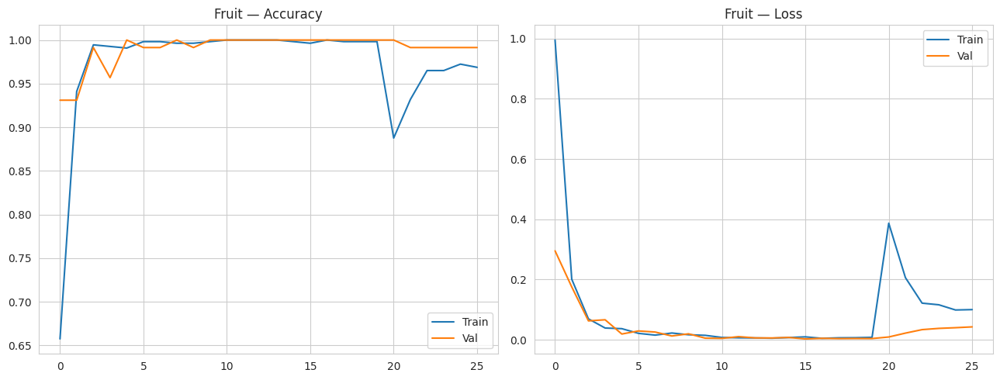

4/4 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.9298 - loss: 0.2951

Fruit — Test Accuracy: 92.98%


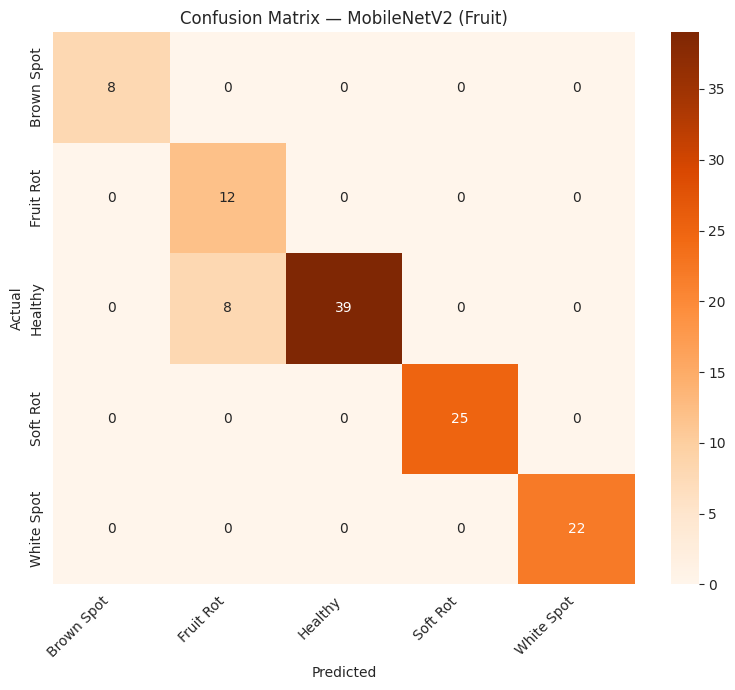

              precision    recall  f1-score   support

  Brown Spot       1.00      1.00      1.00         8
   Fruit Rot       0.60      1.00      0.75        12
     Healthy       1.00      0.83      0.91        47
    Soft Rot       1.00      1.00      1.00        25
  White Spot       1.00      1.00      1.00        22

    accuracy                           0.93       114
   macro avg       0.92      0.97      0.93       114
weighted avg       0.96      0.93      0.94       114



In [35]:
acc = history.history["accuracy"] + history_fine.history["accuracy"]
val_acc = history.history["val_accuracy"] + history_fine.history["val_accuracy"]
loss = history.history["loss"] + history_fine.history["loss"]
val_loss = history.history["val_loss"] + history_fine.history["val_loss"]

fig, axes = plt.subplots(1, 2, figsize=(13,5))
axes[0].plot(acc, label="Train"); axes[0].plot(val_acc, label="Val")
axes[0].set_title(f"{TASK} — Accuracy"); axes[0].legend()
axes[1].plot(loss, label="Train"); axes[1].plot(val_loss, label="Val")
axes[1].set_title(f"{TASK} — Loss"); axes[1].legend()
plt.tight_layout(); plt.show()

y_true, y_pred = [], []
for images, labels in test_ds:
    preds = model.predict(images, verbose=0)
    y_pred.extend(np.argmax(preds, axis=1))
    y_true.extend(labels.numpy())

test_loss, test_acc = model.evaluate(test_ds)
print(f"\n{TASK} — Test Accuracy: {test_acc*100:.2f}%")

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8,7))
sns.heatmap(cm, annot=True, fmt="d", cmap="Oranges", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted"); plt.ylabel("Actual")
plt.title(f"Confusion Matrix — MobileNetV2 ({TASK})")
plt.xticks(rotation=45, ha="right")
plt.tight_layout(); plt.show()

print(classification_report(y_true, y_pred, target_names=class_names))

In [37]:
import tensorflow as tf

def sparse_categorical_focal_loss(gamma=2.0):
    def loss_fn(y_true, y_pred):
        y_true = tf.cast(y_true, tf.int32)
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1 - 1e-7)
        y_true_onehot = tf.one_hot(y_true, depth=tf.shape(y_pred)[-1])
        ce = -y_true_onehot * tf.math.log(y_pred)
        weight = tf.pow(1 - y_pred, gamma)
        fl = weight * ce
        return tf.reduce_sum(fl, axis=-1)
    return loss_fn

In [38]:
from tensorflow.keras import layers, Model

def build_cnn_vit_hybrid(num_classes, img_size=IMG_SIZE, embed_dim=256, num_heads=4):
    base = tf.keras.applications.MobileNetV2(input_shape=img_size + (3,), include_top=False, weights="imagenet")
    base.trainable = False

    inputs = tf.keras.Input(shape=img_size + (3,))
    x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)
    feat_map = base(x, training=False)          # shape: (7, 7, 1280) for 224x224 input

    H, W, C = feat_map.shape[1], feat_map.shape[2], feat_map.shape[3]
    num_patches = H * W

    tokens = layers.Reshape((num_patches, C))(feat_map)   # each spatial cell = one "patch token"
    tokens = layers.Dense(embed_dim)(tokens)

    positions = tf.range(start=0, limit=num_patches, delta=1)
    pos_embed = layers.Embedding(input_dim=num_patches, output_dim=embed_dim)(positions)
    tokens = tokens + pos_embed

    def transformer_block(x, ff_dim=512, dropout=0.1):
        attn = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim // num_heads)(x, x)
        x = layers.LayerNormalization(epsilon=1e-6)(x + attn)
        ff = layers.Dense(ff_dim, activation="gelu")(x)
        ff = layers.Dense(embed_dim)(ff)
        ff = layers.Dropout(dropout)(ff)
        return layers.LayerNormalization(epsilon=1e-6)(x + ff)

    t = transformer_block(tokens)
    t = transformer_block(t)

    t = layers.GlobalAveragePooling1D()(t)
    t = layers.Dropout(0.3)(t)
    t = layers.Dense(128, activation="relu")(t)
    outputs = layers.Dense(num_classes, activation="softmax")(t)

    return Model(inputs, outputs, name="cnn_vit_hybrid"), base

model_hybrid, hybrid_base = build_cnn_vit_hybrid(len(class_names))
model_hybrid.compile(
    optimizer=tf.keras.optimizers.Adam(1e-3),
    loss=sparse_categorical_focal_loss(gamma=2.0),
    metrics=["accuracy"]
)
model_hybrid.summary()

Model: "cnn_vit_hybrid"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_22      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ true_divide_10      │ (None, 224, 224,  │          0 │ input_layer_22[0… │
│ (TrueDivide)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ subtract_10         │ (None, 224, 224,  │          0 │ true_divide_10[0… │
│ (Subtract)          │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ mobilenetv2_1.00_2… │ (None, 7, 7,      │  2,257,984 │ subtract_10[0][0] │
│ (Functional)        │ 1280)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_1 (Reshape) │ (None, 49, 1280)  │          0 │ mobilenetv2_1.00… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_25 (Dense)    │ (None, 49, 256)   │    327,936 │ reshape_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_5 (Add)         │ (None, 49, 256)   │          0 │ dense_25[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 49, 256)   │    263,168 │ add_5[0][0],      │
│ (MultiHeadAttentio… │                   │            │ add_5[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_6 (Add)         │ (None, 49, 256)   │          0 │ add_5[0][0],      │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 49, 256)   │        512 │ add_6[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_26 (Dense)    │ (None, 49, 512)   │    131,584 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_27 (Dense)    │ (None, 49, 256)   │    131,328 │ dense_26[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_24          │ (None, 49, 256)   │          0 │ dense_27[0][0]    │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_7 (Add)         │ (None, 49, 256)   │          0 │ layer_normalizat… │
│                     │                   │            │ dropout_24[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 49, 256)   │        512 │ add_7[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 49, 256)   │    263,168 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_8 (Add)         │ (None, 49, 256)   │          0 │ layer_normalizat… │
│                     │                   │            │ multi_head_atten… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 49, 256)   │        512 │ add_8[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 3,673,669 (14.01 MB)

 Trainable params: 1,415,685 (5.40 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [39]:
callbacks_hybrid = [
    tf.keras.callbacks.EarlyStopping(patience=6, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(factor=0.5, patience=3)
]

history_hybrid = model_hybrid.fit(
    train_ds, validation_data=val_ds, epochs=15,
    callbacks=callbacks_hybrid
)

Epoch 1/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 71s 2s/step - accuracy: 0.6777 - loss: 0.5660 - val_accuracy: 0.8879 - val_loss: 0.0692 - learning_rate: 0.0010
Epoch 2/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 28s 669ms/step - accuracy: 0.9853 - loss: 0.0169 - val_accuracy: 0.9310 - val_loss: 0.0352 - learning_rate: 0.0010
Epoch 3/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 28s 666ms/step - accuracy: 0.9650 - loss: 0.0295 - val_accuracy: 0.9741 - val_loss: 0.0144 - learning_rate: 0.0010
Epoch 4/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 29s 591ms/step - accuracy: 0.9834 - loss: 0.0163 - val_accuracy: 0.9655 - val_loss: 0.0206 - learning_rate: 0.0010
Epoch 5/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 33s 920ms/step - accuracy: 0.9853 - loss: 0.0248 - val_accuracy: 0.9655 - val_loss: 0.1314 - learning_rate: 0.0010
Epoch 6/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 37s 626ms/step - accuracy: 0.9816 - loss: 0.0201 - val_accuracy: 0.9483 - val_loss: 0.0466 - learning_rate: 0.0010
Epoch 7/15
17/17 ━━━━━━━━━━━━━━━━━━━━ 41s 553ms/step - accuracy: 0.9982 - loss: 0.002

4/4 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - accuracy: 0.9474 - loss: 0.1366

Fruit — CNN-ViT Hybrid Test Accuracy: 94.74%


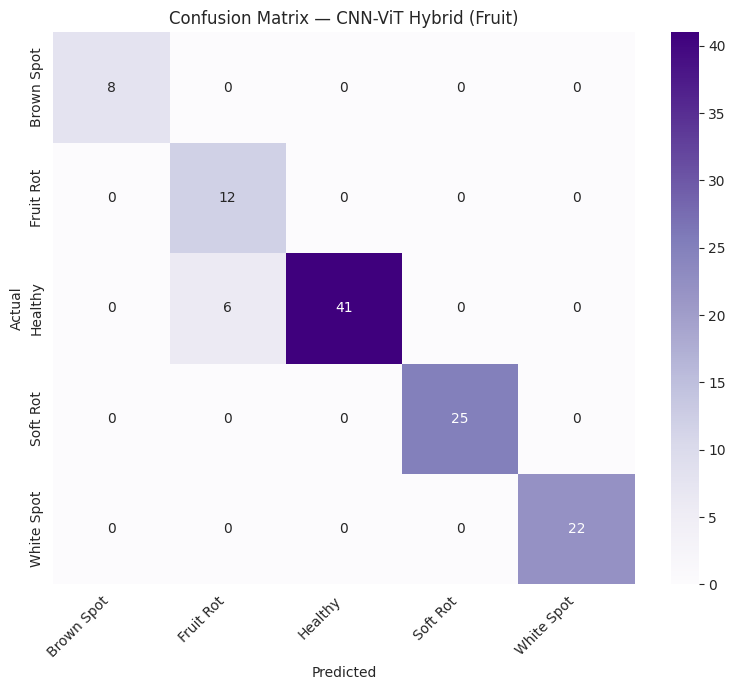

              precision    recall  f1-score   support

  Brown Spot       1.00      1.00      1.00         8
   Fruit Rot       0.67      1.00      0.80        12
     Healthy       1.00      0.87      0.93        47
    Soft Rot       1.00      1.00      1.00        25
  White Spot       1.00      1.00      1.00        22

    accuracy                           0.95       114
   macro avg       0.93      0.97      0.95       114
weighted avg       0.96      0.95      0.95       114



In [40]:
from sklearn.metrics import classification_report, confusion_matrix

y_true_h, y_pred_h = [], []
for images, labels in test_ds:
    preds = model_hybrid.predict(images, verbose=0)
    y_pred_h.extend(np.argmax(preds, axis=1))
    y_true_h.extend(labels.numpy())

test_loss_h, test_acc_h = model_hybrid.evaluate(test_ds)
print(f"\n{TASK} — CNN-ViT Hybrid Test Accuracy: {test_acc_h*100:.2f}%")

cm_h = confusion_matrix(y_true_h, y_pred_h)
plt.figure(figsize=(8,7))
sns.heatmap(cm_h, annot=True, fmt="d", cmap="Purples", xticklabels=class_names, yticklabels=class_names)
plt.title(f"Confusion Matrix — CNN-ViT Hybrid ({TASK})")
plt.xlabel("Predicted"); plt.ylabel("Actual")
plt.xticks(rotation=45, ha="right")
plt.tight_layout(); plt.show()

print(classification_report(y_true_h, y_pred_h, target_names=class_names))

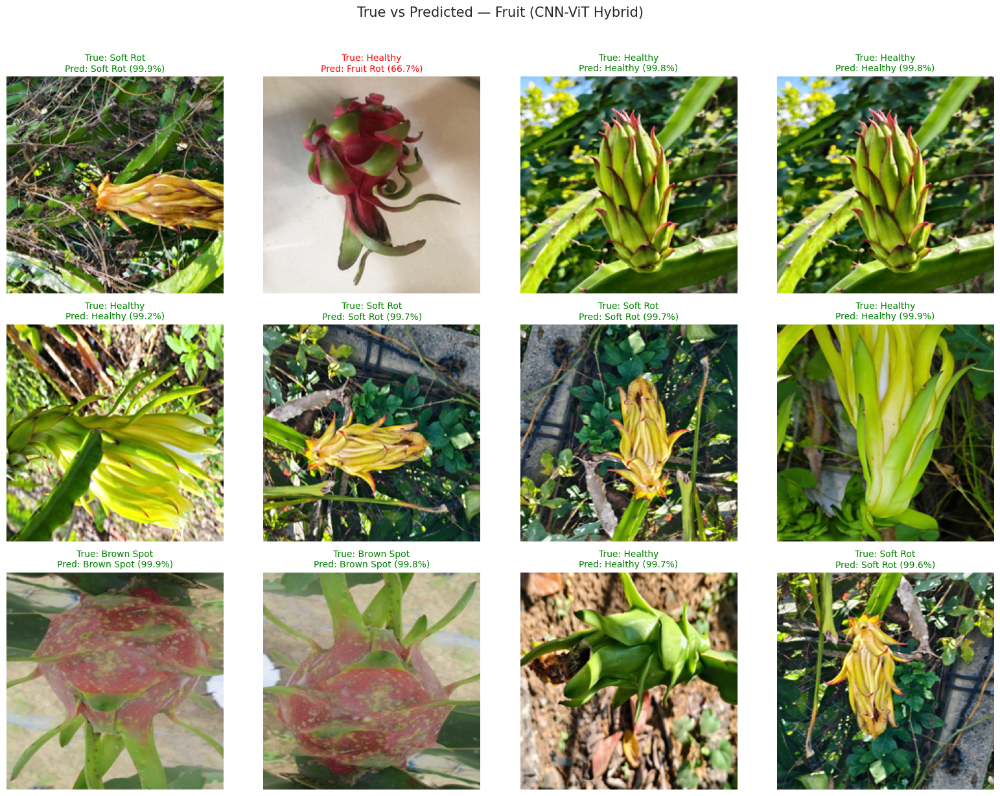

In [42]:
def show_predictions_grid(model, test_df, class_names, task_name, num_images=12, seed=1):
    sample_df = test_df.sample(min(num_images, len(test_df)), random_state=seed).reset_index(drop=True)
    cols = 4
    rows = int(np.ceil(len(sample_df) / cols))
    plt.figure(figsize=(4*cols, 4*rows))

    for i, row in sample_df.iterrows():
        img = Image.open(row["filepath"]).convert("RGB").resize(IMG_SIZE)
        img_arr = np.array(img).astype("float32")
        input_tensor = np.expand_dims(img_arr, axis=0)

        pred = model.predict(input_tensor, verbose=0)
        pred_idx = np.argmax(pred[0])
        pred_label = class_names[pred_idx]
        confidence = pred[0][pred_idx] * 100
        true_label = row["label"]

        plt.subplot(rows, cols, i+1)
        plt.imshow(img_arr.astype("uint8"))
        color = "green" if pred_label == true_label else "red"
        plt.title(f"True: {true_label}\nPred: {pred_label} ({confidence:.1f}%)", color=color, fontsize=10)
        plt.axis("off")

    plt.suptitle(f"True vs Predicted — {task_name} (CNN-ViT Hybrid)", y=1.02, fontsize=15)
    plt.tight_layout()
    plt.show()

show_predictions_grid(model_hybrid, test_df, class_names, TASK)